# Visualizing nd Data

In [39]:
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns
import numpy as np 
from sklearn import manifold 

In [40]:
df = pd.read_csv("P87-Section-2-Dataset-Basics-Resources\\P87-S2-Dataset-Basics-Resources\\heart.csv")
target = df["target"].to_numpy()
df = df[["age", "sex", "cp", "trestbps", "chol", "thalach"]]
df.head()

,age,sex,cp,trestbps,chol,thalach
0,63,1,3,145,233,150
1,37,1,2,130,250,187
2,41,0,1,130,204,172
3,56,1,1,120,236,178
4,57,0,0,120,354,163


## Scatter matrix

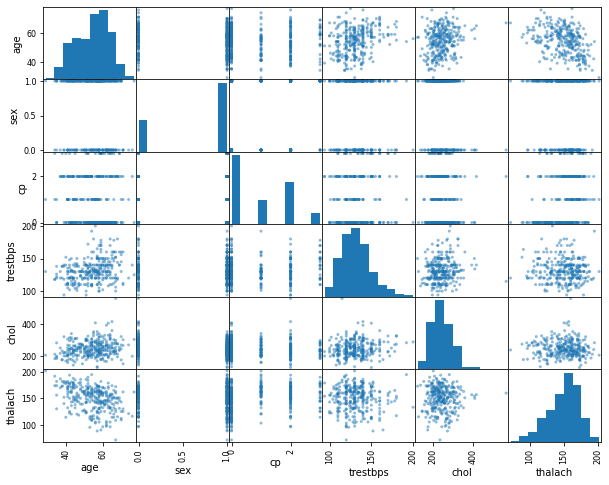

In [41]:
pd.plotting.scatter_matrix(df, figsize = (10, 8));

## Correlation matrix

In [42]:
df.corr(method="pearson")

,age,sex,cp,trestbps,chol,thalach
age,1.000000,-0.098447,-0.068653,0.279351,0.213678,-0.398522
sex,-0.098447,1.000000,-0.049353,-0.056769,-0.197912,-0.044020
cp,-0.068653,-0.049353,1.000000,0.047608,-0.076904,0.295762
trestbps,0.279351,-0.056769,0.047608,1.000000,0.123174,-0.046698
chol,0.213678,-0.197912,-0.076904,0.123174,1.000000,-0.009940
thalach,-0.398522,-0.044020,0.295762,-0.046698,-0.009940,1.000000


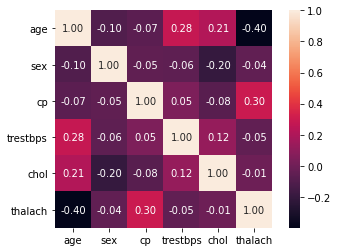

In [43]:
ax = sns.heatmap(df.corr(), annot=True, square = True, fmt="0.2f");

## Manifold Learning

### Manifold Learning is all about learning complex non-linear relationships in your data. It is effectively learning a relaionship, mapping your data onto that learned relationship to see how the relationships look.

In [44]:
np.random.seed(0)
n = 2000
t = np.linspace(0, 20, n)
x = t * np.sin(t) + 0.2 * np.random.normal(size = n)
y = t * np.cos(t) + 0.2 * np.random.normal(size = n)

z = np.log(t + 1) * np.sin(np.sqrt(t)) + 0.1 * np.random.normal(size = n)
a = np.log(t + 1) * np.cos(np.sqrt(t)) + 0.1 * np.random.normal(size = n)

df2 = pd.DataFrame({"x":x, "y":y, "z":z, "a":a})
data = df2.to_numpy()

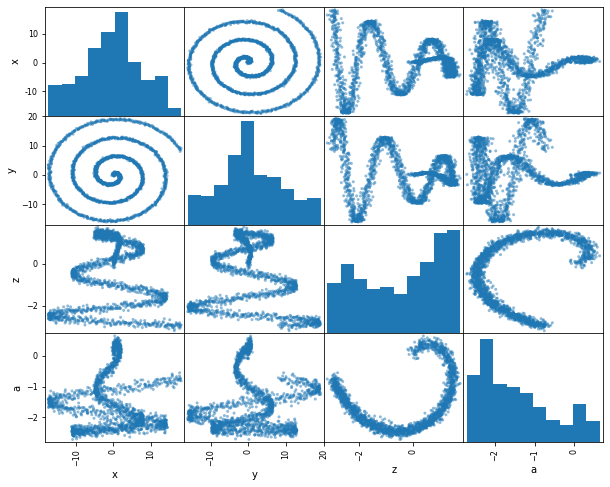

In [45]:
pd.plotting.scatter_matrix(df2, figsize = (10, 8));

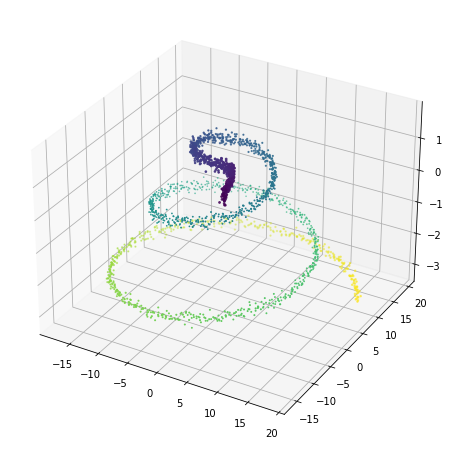

In [46]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(projection = "3d")
ax.scatter(x, y, z, c = t, s = 3 + a);

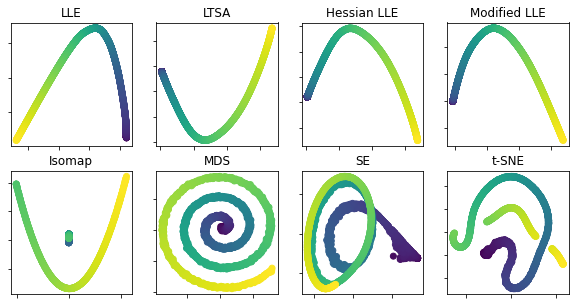

In [48]:
methods = [
    ("LLE", manifold.LocallyLinearEmbedding(n_neighbors=20, method="standard")),
    ("LTSA", manifold.LocallyLinearEmbedding(n_neighbors=20, method="ltsa")),
    ("Hessian LLE", manifold.LocallyLinearEmbedding(n_neighbors=20, method="hessian")),
    ("Modified LLE", manifold.LocallyLinearEmbedding(n_neighbors=20, method="modified")),
    ("Isomap", manifold.Isomap()),
    ("MDS", manifold.MDS(n_init=1)),
    ("SE", manifold.SpectralEmbedding()),
    ("t-SNE", manifold.TSNE())
]

fig, axes = plt.subplots(nrows = 2, ncols = 4, figsize = (10, 5))
for (name, method), ax in zip(methods, axes.flatten()):
    #print(f"Running {name}")
    Y  = method.fit_transform(data)
    ax.scatter(Y[:,0], Y[:,1], c = t)
    ax.set_title(name)
    ax.set_xticklabels([])
    ax.set_yticklabels([])

Method Hessian LLE failed


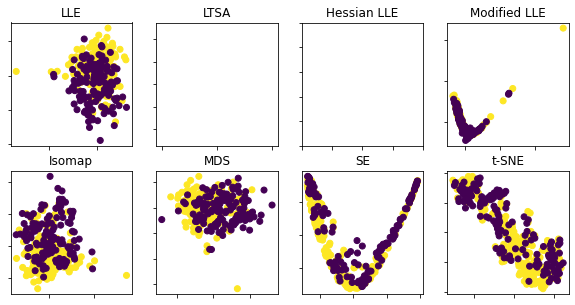

In [50]:
# applying manifold learning to hearts data

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(10, 5))

for (name, method), ax in zip(methods, axes.flatten()):
    #print(f"Running {name}")
    try:
        Y = method.fit_transform(df.to_numpy())
        ax.scatter(Y[:, 0], Y[:, 1], c = target)
    except:
        print(f"Method {name} failed")
    
    ax.set_title(name)
    ax.set_xticklabels([])
    ax.set_yticklabels([])